# Final Project: Predicting Subscribing Behaviours using Hours Played and Age

## Introduction 

The Pacific Laboratory for Artificial Intelligence(PLAI), led by Frank Wood, is exploring individual behaviour in video games. Their research will enable them to create more sophisticated AI capable of acting in an intricate virtual environment. Particularly, they set up a Minecraft server(PLAICRAFT) to observe player interactions with other players, both voice and behavioural, along with hours spent playing. For players under the age of 13, a parental consent form was filled out.  


PLAI’s board question: What player characteristics and behaviours are most predictive of subscribing to a game-related newsletter, and how do these features differ between various player types?. 

This board question allowed us to formulate our **specific question** that is: Can hours played and Age predict whether the player is subscribing to the game-related newsletter?

We will explore this question using KNN classification. We expect that hours played and Age will very accurately predict a user's subscribing behaviours. 

### Data Description:

| Variable       | Type        | Description                                                  |
|----------------|------------|--------------------------------------------------------------|
| experience     | categorical | Different game level of the players (Beginner to  Veteran). |
| subscribe      | logical     | Whether the player subscribed to the game newsletter (TRUE or FALSE).       |
| hashedEmail    | character   | A private and unique representation of encoding one’s email address using a cryptographic hashing function. Each player in the data set has a unique hashed email.  |
| played_hours   | numeric     | The time the players spent on the game (hours).     |
| name           | character   | Player’s name or nickname.    |
| gender         | categorical | Gender of players.                                       |
| Age            | numeric     | Age of players (year).                                 |


## Methods & Results

### Exploratory Data Analysis and Visualization 

First, we load `players.csv` dataset. We do this by utilizing GitHub’s file uploads and the readr function “read_csv” to read datasets from a remote URL. This keeps our Jupyter notebook running fully remote with no extra file dependencies.

In [1]:
library(tidyverse)
library(tidymodels)
library(repr)
library(ggplot2)
options(repr.plot.width = 12, repr.plot.height = 6)#formats all scatterplots 
options(repr.matrix.max.rows = 6)

── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.4     ✔ readr     2.1.5
✔ forcats   1.0.0     ✔ stringr   1.5.1
✔ ggplot2   3.5.1     ✔ tibble    3.2.1
✔ lubridate 1.9.3     ✔ tidyr     1.3.1
✔ purrr     1.0.2     
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors
── Attaching packages ────────────────────────────────────── tidymodels 1.1.1 ──

✔ broom        1.0.6     ✔ rsample      1.2.1
✔ dials        1.3.0     ✔ tune         1.1.2
✔ infer        1.0.7     ✔ workflows    1.1.4
✔ modeldata    1.4.0     ✔ workflowsets 1.0.1
✔ parsnip      1.2.1     ✔ yardstick    1.3.1
✔ recipes      1.1.0     

── Conflicts ───────────────────────────────────────── tidymodels_conflicts() ──
✖ scales::discard() masks purrr::discard()
✖ dplyr::filt

In [2]:
players_url <- "https://raw.githubusercontent.com/604Beast/FINAL_Project_GROUP27/refs/heads/main/players.csv"
players <- read_csv(players_url) 

Rows: 196 Columns: 7
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (4): experience, hashedEmail, name, gender
dbl (2): played_hours, Age
lgl (1): subscribe

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


We see there are 196 observations in `players.csv` and 7 variables. We will only be using `subcribe`, `played_hours` and `Age` as seen in figure 1.

In [3]:
players_clean <- players |> 
                select(subscribe,played_hours, Age) |> #Selecting revelant variables
                mutate(subscribe = as.factor(subscribe)) 
head(players_clean)
                

subscribe,played_hours,Age
<fct>,<dbl>,<dbl>
TRUE,30.3,9
TRUE,3.8,17
FALSE,0.0,17
TRUE,0.7,21
TRUE,0.1,21
TRUE,0.0,17


Figure  1


We 

In [4]:
num_obs <-nrow(players_clean)
players_summary <- players_clean|> 
            group_by(subscribe) |>
            summarize(mean_played_hours = round(mean(played_hours, na.rm = TRUE), 2 ), #rounded to 2 decimals
                     mean_Age = round(mean(Age, na.rm = TRUE), 2), 
                     count = n(),
            percentage = round(n() / num_obs * 100, 2))

players_summary 

subscribe,mean_played_hours,mean_Age,count,percentage
<fct>,<dbl>,<dbl>,<int>,<dbl>
FALSE,0.50,23.75,52,26.53
TRUE,7.78,20.18,144,73.47


Figure 2

Warning message:
“Removed 2 rows containing missing values or values outside the scale range
(`geom_point()`).”


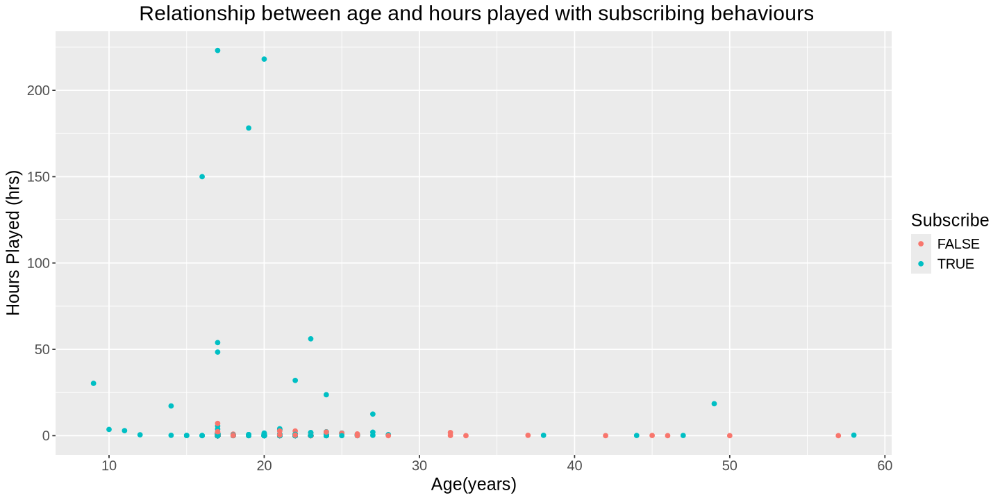

In [5]:

players_plot <- ggplot(players_clean, aes( x = Age, y = played_hours, color = subscribe))+
                    geom_point()+
                    ggtitle(" Relationship between age and hours played with subscribing behaviours") + 
                    labs( x = "Age(years)", y = "Hours Played (hrs)", color = "Subscribe")+ 
                    theme(text = element_text(size = 15)) +
                    theme(plot.title = element_text(hjust =0.5))
players_plot

Figure 3

Warning message:
“Removed 2 rows containing missing values or values outside the scale range
(`geom_point()`).”


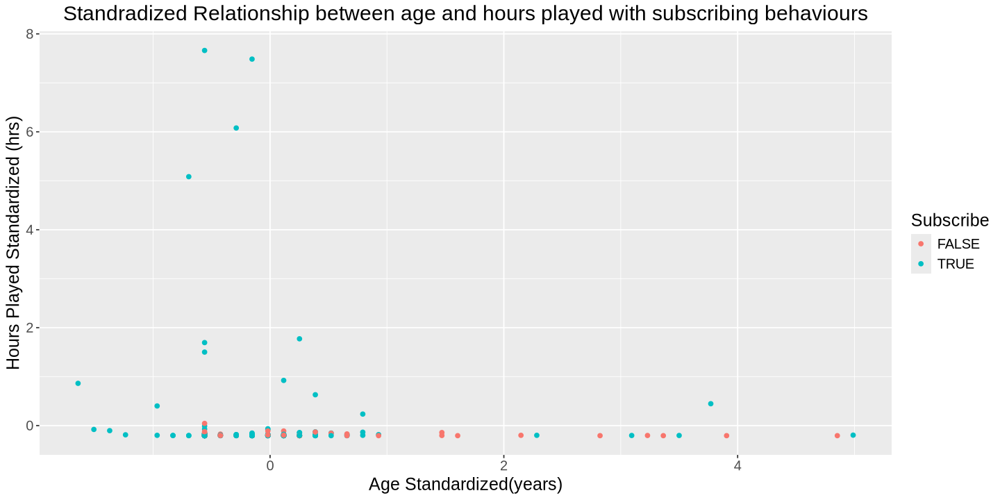

In [6]:
set.seed(9999)
players_standardized <- recipe(subscribe ~ played_hours + Age, data = players_clean) |>
                    step_scale(all_predictors()) |>
                    step_center(all_predictors()) |>
                    prep() |>
                    bake(players_clean)

players_plot <-ggplot(players_standardized, aes( x = Age, y = played_hours, 
                                            color = subscribe))+
                    geom_point()+
                    ggtitle("Standradized Relationship between age and hours played with subscribing behaviours") + 
                    labs( x = "Age Standardized(years)", y = "Hours Played Standardized (hrs)", color = "Subscribe")+ 
                    theme(text = element_text(size = 15)) +
                    theme(plot.title = element_text(hjust =0.5))
players_plot

Figure 4

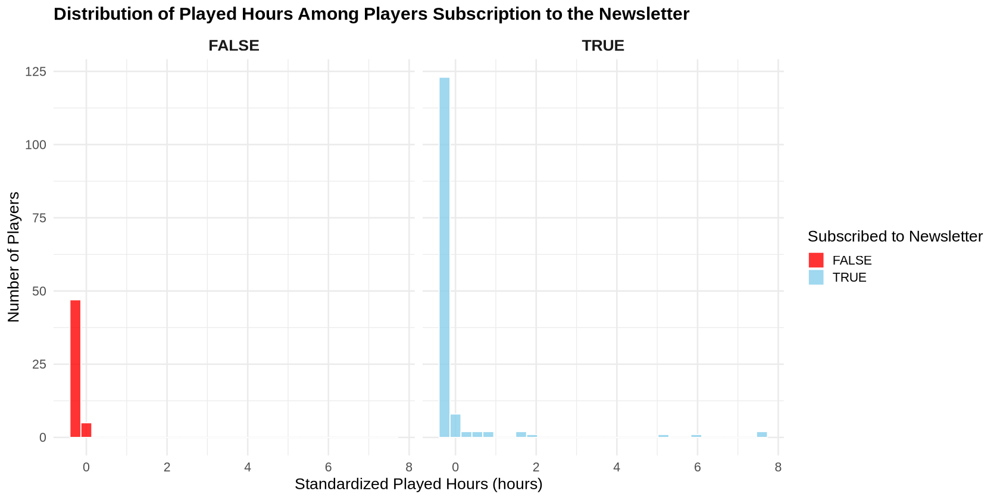

In [7]:
# options(repr.plot.width = 8, repr.plot.height = 7)

# players_histogram_hours <- ggplot(players_clean, aes(x = played_hours, fill = subscribe)) + 
#                         geom_histogram()+
#                         facet_grid(rows = vars(subscribe))+
#                         ggtitle("Distribution of hours played with subscribing behaviours")+
#                         labs( x = "Hours Played(hrs)", y = "Number of players")+
#                      theme(text = element_text(size = 15)) +
#                     theme(plot.title = element_text(hjust =0.5))

# players_histogram_hours

options(repr.plot.width = 14, repr.plot.height = 7)

players_histogram_hours <- players_standardized |>
    ggplot(aes(x = played_hours, fill = subscribe)) +
      geom_histogram(bins = 30, alpha = 0.8, color = "white") +
      facet_grid(. ~ subscribe) +
      scale_fill_manual(values = c("FALSE" = "red", "TRUE" = "skyblue")) +
      labs(
        title = "Distribution of Played Hours Among Players Subscription to the Newsletter",
        x = "Standardized Played Hours (hours)",
        y = "Number of Players",
        fill = "Subscribed to Newsletter"
      ) +
      theme_minimal(base_size = 16) +
      theme(
        plot.title = element_text(size = 18, face = "bold"),
        strip.text = element_text(size = 16, face = "bold")
      )

players_histogram_hours

Figure 5

Warning message:
“Removed 2 rows containing non-finite outside the scale range (`stat_bin()`).”


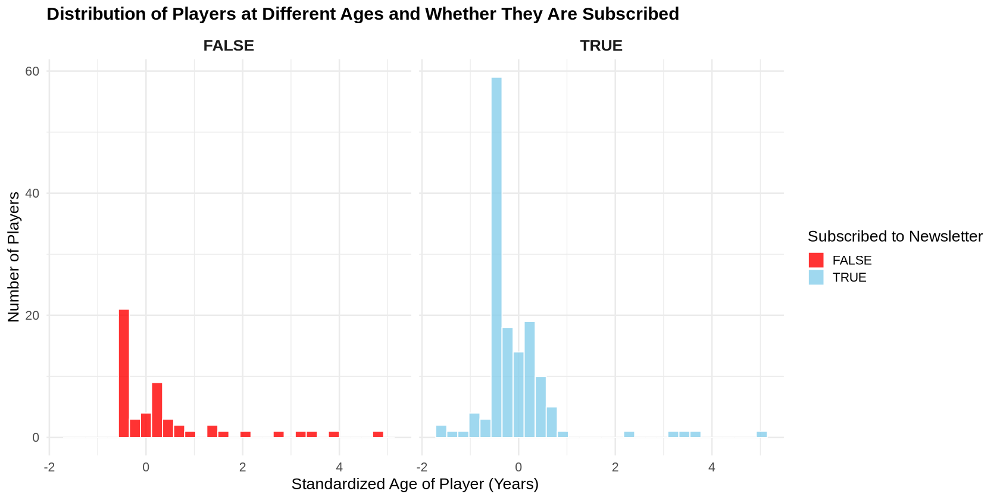

In [8]:

# players_histogram_age <- ggplot(players_clean, aes(x = Age, fill = subscribe)) + 
#                         geom_histogram()+
#                         facet_grid(rows = vars(subscribe))+
#                          ggtitle("Distribution of age with subscribing behaviours")+
#                     labs( x = "Age(years)", y = "Number of players")+
#                      theme(text = element_text(size = 15)) +
#                     theme(plot.title = element_text(hjust =0.5))
# players_histogram_age

options(repr.plot.width = 14, repr.plot.height = 7)

players_histogram_age <- players_standardized |>
    ggplot(aes(x = Age, fill = subscribe)) +
      geom_histogram(bins = 30, alpha = 0.8, color = "white") +
      facet_grid(. ~ subscribe) +
      scale_fill_manual(values = c("FALSE" = "red", "TRUE" = "skyblue")) +
      labs(
        title = "Distribution of Players at Different Ages and Whether They Are Subscribed",
        x = "Standardized Age of Player (Years)",
        y = "Number of Players",
        fill = "Subscribed to Newsletter"
      ) +
      theme_minimal(base_size = 16) +
      theme(
        plot.title = element_text(size = 18, face = "bold"),
        strip.text = element_text(size = 16, face = "bold")
      )

players_histogram_age

Figure 6

### Classifier preprocessing and finding the best $k$ value

In [9]:
set.seed(9999)
players_split <- initial_split(players_clean, prop = 0.70, strata = subscribe)  
players_training <- training(players_split)
players_testing <-testing(players_split)

head(players_training)
nrow(players_training)  
nrow(players_testing) 

subscribe,played_hours,Age
<fct>,<dbl>,<dbl>
FALSE,0.0,17
FALSE,0.0,21
FALSE,0.0,22
FALSE,0.1,17
FALSE,0.0,23
FALSE,0.1,18


[1] 136

[1] 60

Figure 7

In [10]:
player_training_summary <- players_training|> 
            group_by(subscribe) |>
            summarize(mean_played_hours = round(mean(played_hours, na.rm = TRUE), 2 ), #rounded to 2 decimals
                     mean_Age = round(mean(Age, na.rm = TRUE), 2), #rounded to 2 decimals
                     count = n(),
            percentage = round(n() / 136 * 100, 2))
player_training_summary

subscribe,mean_played_hours,mean_Age,count,percentage
<fct>,<dbl>,<dbl>,<int>,<dbl>
FALSE,0.54,21.56,36,26.47
TRUE,4.89,20.59,100,73.53


Figure 8

In [11]:
set.seed(9999) 
players_recipe <-recipe(subscribe ~ played_hours +Age, data = players_training)|> 
                step_scale(all_predictors()) |>
                step_center(all_predictors())

In [12]:
set.seed(9999)
players_tune <- nearest_neighbor(weight_func = "rectangular", neighbors = tune()) |> 
            set_engine("kknn")|>
            set_mode("classification") 

In [13]:
set.seed(9999)
players_vfold <- vfold_cv(players_training, v = 5, strata = subscribe)
k_vals <- tibble(neighbors = c(1:50))

In [14]:
set.seed(9999)
players_results <-workflow() |>
                add_recipe(players_recipe)|>
                add_model(players_tune) |>
                tune_grid(resamples = players_vfold, grid = k_vals)|>
                collect_metrics()|>
                filter(.metric == "accuracy")|>
                select(neighbors, mean) |>
                arrange(desc(mean))

head(players_results)

→ A | error:   Assigned data `orig_rows` must be compatible with existing data.
               ✖ Existing data has 26 rows.
               ✖ Assigned data has 27 rows.
               ℹ Only vectors of size 1 are recycled.
               Caused by error in `vectbl_recycle_rhs_rows()`:
               ! Can't recycle input of size 27 to size 26.

There were issues with some computations   A: x1

There were issues with some computations   A: x2

There were issues with some computations   A: x2





neighbors,mean
<int>,<dbl>
24,0.7689594
19,0.7566138
21,0.7566138
25,0.7566138
22,0.7442681
23,0.7442681


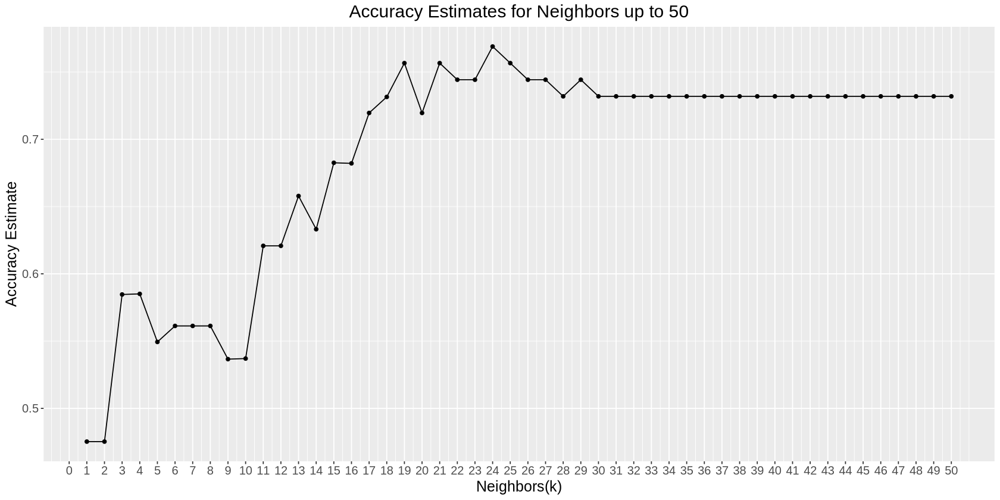

In [15]:
accuracy_vs_k <- ggplot(players_results, aes(x = neighbors, y = mean))+ 
                geom_point()+ 
                geom_line()+ 
                labs( x = "Neighbors(k)", y = "Accuracy Estimate") + 
                scale_x_continuous(breaks = seq(0,50, by = 1)) + 
                ggtitle("Accuracy Estimates for Neighbors up to 50")+
                theme(plot.title = element_text(hjust =0.5))+
                theme(text = element_text(size = 15))

accuracy_vs_k

Figure 8

In [16]:
set.seed(9999)
players_best_spec <- nearest_neighbor(weight_func = "rectangular", neighbors = 23) |>
                set_engine("kknn") |>
                set_mode("classification")

players_fit <- workflow() |>
            add_recipe(players_recipe) |>
            add_model(players_best_spec) |>
            fit(data = players_training)
players_fit
                                       

══ Workflow [trained] ══════════════════════════════════════════════════════════
Preprocessor: Recipe
Model: nearest_neighbor()

── Preprocessor ────────────────────────────────────────────────────────────────
2 Recipe Steps

• step_scale()
• step_center()

── Model ───────────────────────────────────────────────────────────────────────

Call:
kknn::train.kknn(formula = ..y ~ ., data = data, ks = min_rows(23,     data, 5), kernel = ~"rectangular")

Type of response variable: nominal
Minimal misclassification: 0.2686567
Best kernel: rectangular
Best k: 23

Warning message:
“Removed 2 rows containing missing values or values outside the scale range
(`geom_point()`).”


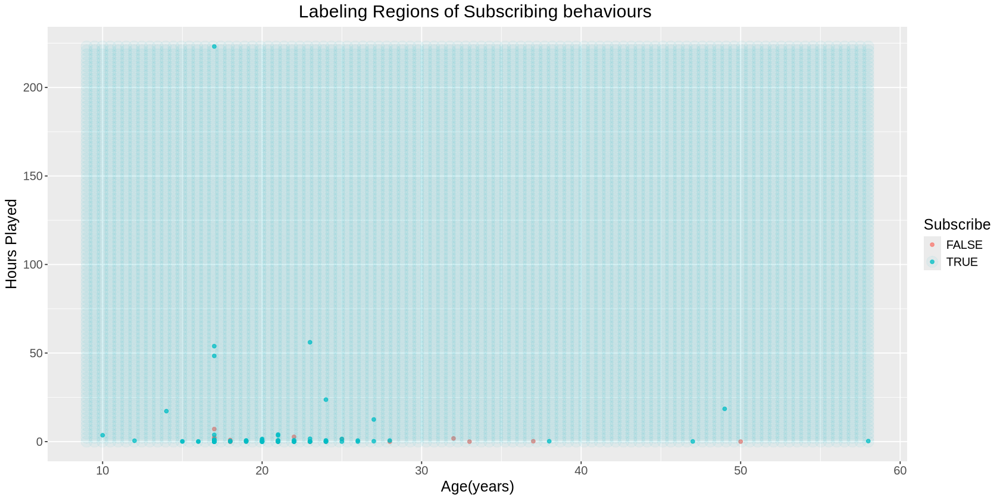

In [17]:
set.seed(9999)
played_hours_grid<- seq(min(players_clean$played_hours), 
                max(players_clean$played_hours ), 
                length.out = 100)

Age_grid <- seq(min(players_clean$Age,na.rm = TRUE), 
                max(players_clean$Age, na.rm= TRUE), 
                length.out = 100)

all_grid <- as_tibble(expand.grid(played_hours =  played_hours_grid, 
                        Age= Age_grid))

predgrid <- predict(players_fit, all_grid)
pred_df <- bind_cols(predgrid,all_grid) 


plot_results <- ggplot(players_training, aes(x = Age, y = played_hours, color = subscribe)) + 
                geom_point(alpha = 0.75) +
                geom_point(data = pred_df, aes(color=.pred_class),
                           alpha = 0.05, 
                           size = 5) +
                labs(x = "Age(years)", y = "Hours Played", 
                     color = "Subscribe", 
                     title = "Labeling Regions of Subscribing behaviours ") +
                theme(plot.title = element_text(hjust =0.5))+
                theme(text = element_text(size = 15))

plot_results

Figure 9

In [18]:
players_predictions <- predict(players_fit, players_testing) |>
                bind_cols(players_testing)


In [19]:
players_metrics <- players_predictions |>
        metrics(truth = subscribe, estimate = .pred_class)|>
        filter( .metric == "accuracy")

players_metrics

.metric,.estimator,.estimate
<chr>,<chr>,<dbl>
accuracy,binary,0.7333333


In [20]:
players_conf_mat <- players_predictions |>
                    conf_mat(truth = subscribe, estimate = .pred_class)

players_conf_mat
                

          Truth
Prediction FALSE TRUE
     FALSE     0    0
     TRUE     16   44

Figure 10